In [228]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
import cv2 as cv2

from numpy import pi
from numpy import sin
from numpy import zeros
from numpy import r_
from scipy import signal
from scipy import misc # pip install Pillow
import matplotlib.pylab as pylab
from skimage import measure
import imutils

%matplotlib inline
pylab.rcParams['figure.figsize'] = (38, 42)
import os

In [31]:
def dct2(a):
    return scipy.fftpack.dct( scipy.fftpack.dct( a, axis=0, norm='ortho' ), axis=1, norm='ortho' )

def idct2(a):
    return scipy.fftpack.idct( scipy.fftpack.idct( a, axis=0 , norm='ortho'), axis=1 , norm='ortho')

def fix_image(image):
    #hist_equalization

    # clip all negative values to 0
    image = image.clip(min=0)

    # scale within the interval [0,255]
    image *= 255 / np.max(image)

    # calculate image histogram, with 256 bins returning probability density of each bin
    image_histogram, bins = np.histogram(image.flatten(), 256, normed=True)
    
    # compute the image's cumulative distribution function (CDF)
    cdf = image_histogram.cumsum()
    cdf = 255 * cdf / cdf[-1]

    # use linear interpolation of the CDF to adjust the image
    return np.interp(image.flatten(), bins[:-1], cdf).reshape(image.shape)

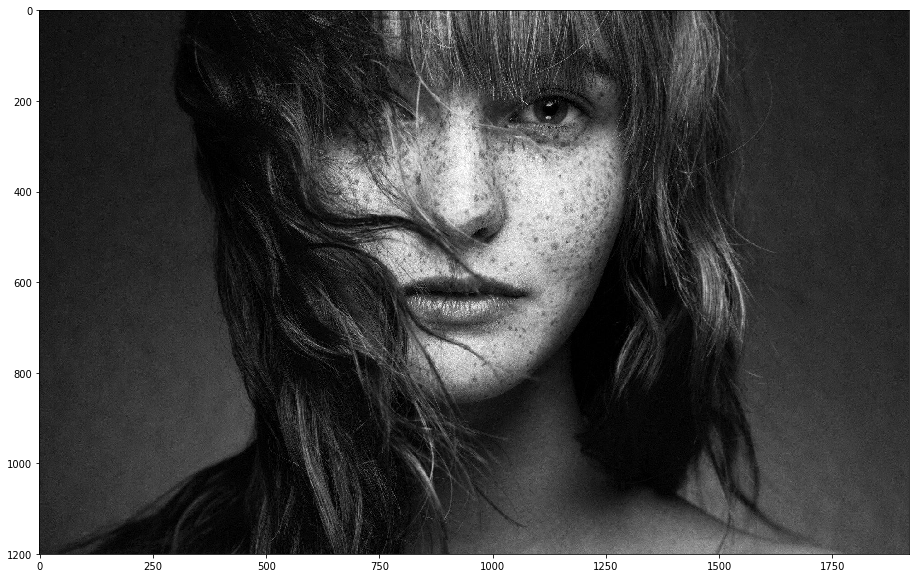

In [68]:
im = cv2.imread("3.jpg",0)
plt.imshow(img,cmap='gray')
dim_1, dim_2 = img.shape[0],img.shape[1]

In [152]:
B = 12

In [153]:
imsize = im.shape
dct = np.zeros(imsize)

# Do 8x8 DCT on image (in-place)
for i in r_[:imsize[0]:B]:
    for j in r_[:imsize[1]:B]:
        dct[i:(i+B),j:(j+B)] = dct2(im[i:(i+B),j:(j+B)])

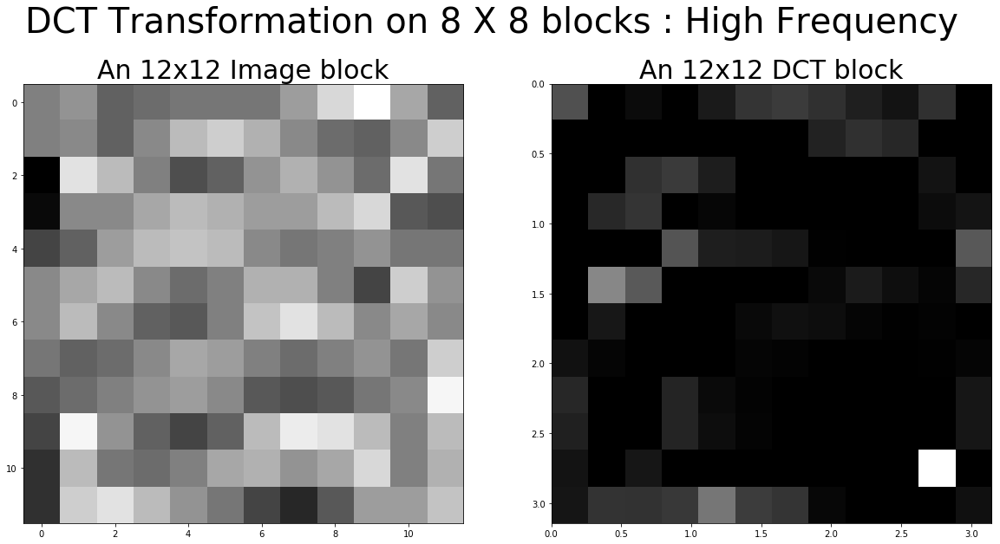

In [154]:
pos = 230
fig, (ax1, ax2) = plt.subplots(1,2)
fig.suptitle('DCT Transformation on 8 X 8 blocks : High Frequency', fontsize=40)
ax1.set_title('An ' + str(B) + 'x' + str(B) + ' Image block', fontsize=30)
im1 = ax1.imshow(im[pos:pos+B,pos:pos+B],cmap='gray')
ax2.set_title('An ' + str(B) + 'x' + str(B) + ' DCT block', fontsize=30)
im2 = ax2.imshow(dct[pos:pos+B,pos:pos+B],vmax= np.max(dct)*0.01,vmin = 0, extent=[0,pi,pi,0],cmap='gray')
plt.show()

Text(0.5,1,'12x12 DCTs of the image')

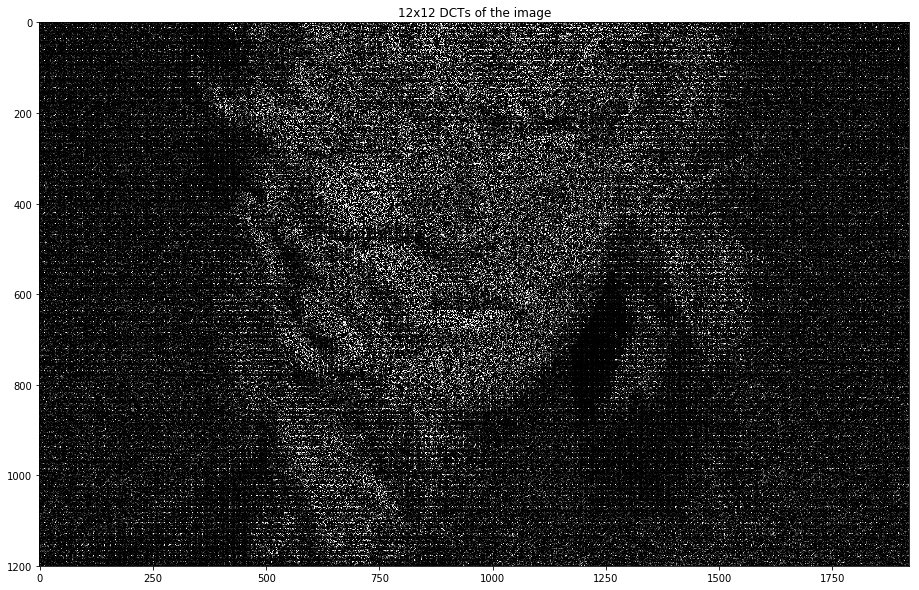

In [155]:
plt.imshow(dct,cmap='gray',vmax = np.max(dct)*0.01,vmin = 0)
plt.title(str(B) + 'x' + str(B) + " DCTs of the image")

Keeping only 2.849740% of the DCT coefficients


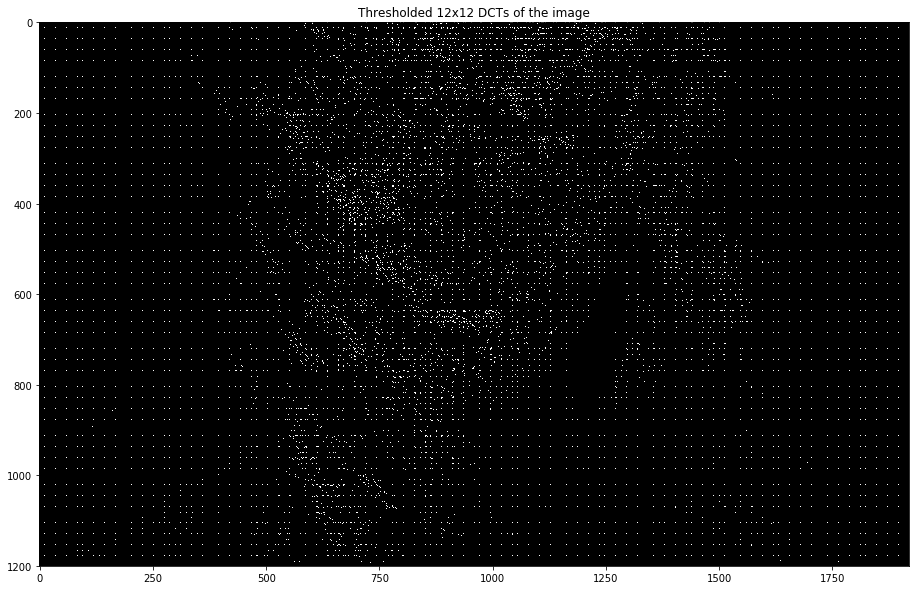

In [156]:
# Threshold
thresh = 0.012
dct_thresh = dct * (abs(dct) > (thresh*np.max(dct)))


plt.figure()
plt.imshow(dct_thresh,cmap='gray',vmax = np.max(dct)*0.01,vmin = 0)
plt.title( "Thresholded " + str(B) + 'x' + str(B) + " DCTs of the image")

percent_nonzeros = np.sum( dct_thresh != 0.0 ) / (imsize[0]*imsize[1]*1.0)

print "Keeping only %f%% of the DCT coefficients" % (percent_nonzeros*100.0)


Text(0.5,1,'Comparison between original and DCT compressed images')

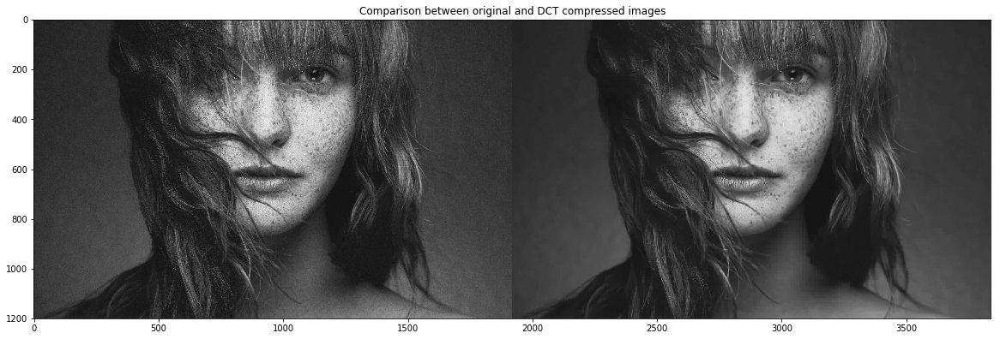

In [157]:

im_dct = np.zeros(imsize)

for i in r_[:imsize[0]:B]:
    for j in r_[:imsize[1]:B]:
        im_dct[i:(i+B),j:(j+B)] = idct2( dct_thresh[i:(i+B),j:(j+B)] )
        
        
plt.figure()
plt.imshow( np.hstack( (im, im_dct) ) ,cmap='gray')
plt.title("Comparison between original and DCT compressed images" )

In [158]:
cv2.imwrite('girl_12.jpg',im_dct)

True

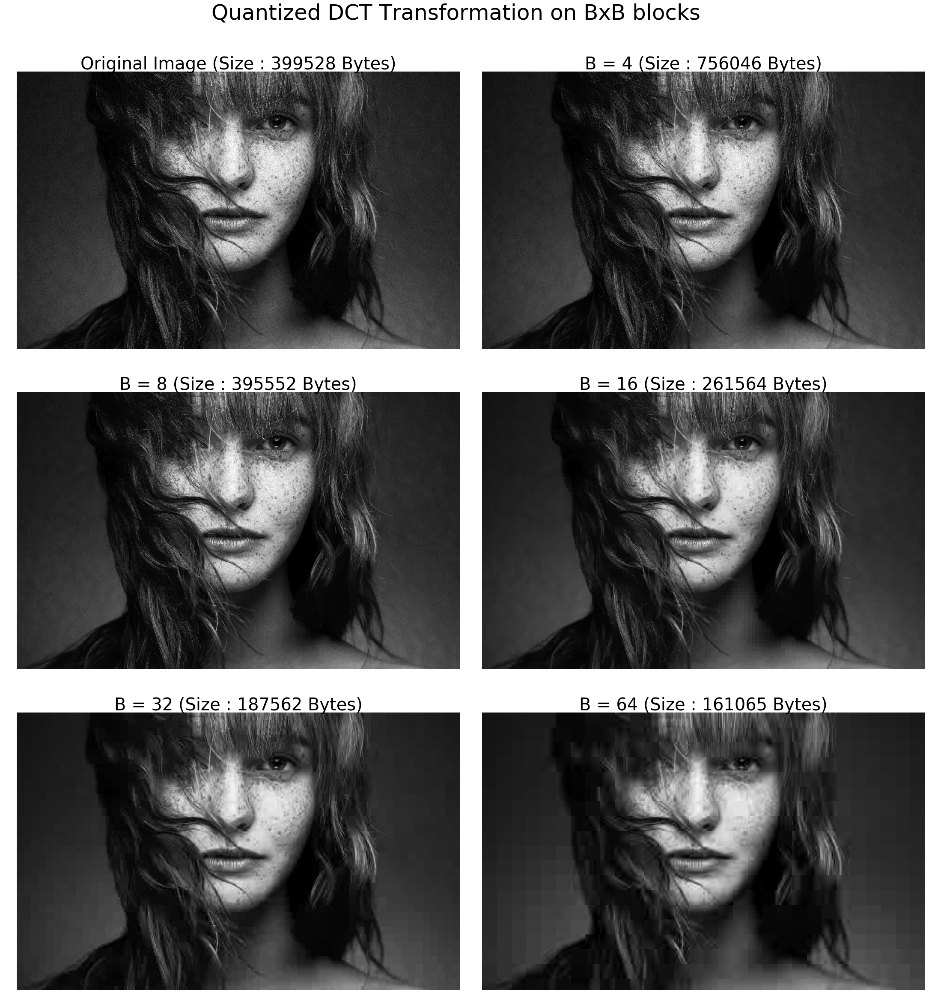

In [214]:
fig, ([ax1, ax2], [ax3, ax4], [ax5, ax6]) = plt.subplots(3,2)
fig.subplots_adjust(hspace=-0.05, wspace=0.05)

fig.suptitle('Quantized DCT Transformation on ' + 'BxB' + ' blocks', fontsize=50, y=0.91)
ax1.set_title('Original Image (Size : ' + str(os.path.getsize("girl.jpg")) + ' Bytes)', fontsize=40)
im1 = ax1.imshow(cv2.imread("girl.jpg"))
ax2.set_title('B = 4 (Size : ' + str(os.path.getsize("girl_4.jpg")) + ' Bytes)', fontsize=40)
im2 = ax2.imshow(cv2.imread("girl_4.jpg"))
ax3.set_title('B = 8 (Size : ' + str(os.path.getsize("girl_8.jpg")) + ' Bytes)', fontsize=40)
im3 = ax3.imshow(cv2.imread("girl_8.jpg"))
ax4.set_title('B = 16 (Size : ' + str(os.path.getsize("girl_16.jpg")) + ' Bytes)', fontsize=40)
im4 = ax4.imshow(cv2.imread("girl_16.jpg"))
ax5.set_title('B = 32 (Size : ' + str(os.path.getsize("girl_32.jpg")) + ' Bytes)', fontsize=40)
im5 = ax5.imshow(cv2.imread("girl_32.jpg"))
ax6.set_title('B = 64 (Size : ' + str(os.path.getsize("girl_64.jpg")) + ' Bytes)', fontsize=40)
im6 = ax6.imshow(cv2.imread("girl_64.jpg"))
ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
ax4.axis('off')
ax5.axis('off')
ax6.axis('off')
plt.show()

In [255]:
img1 = cv2.imread("girl.jpg",0)
img2 = cv2.resize(cv2.imread("compressed.jpg",0),(img1.shape[1],img1.shape[0]))
img3 = cv2.resize(cv2.imread("girl_4.jpg",0),(img1.shape[1],img1.shape[0]))
img4 = cv2.resize(cv2.imread("girl_8.jpg",0),(img1.shape[1],img1.shape[0]))
img5 = cv2.resize(cv2.imread("girl_16.jpg",0),(img1.shape[1],img1.shape[0]))
img6 = cv2.resize(cv2.imread("girl_32.jpg",0),(img1.shape[1],img1.shape[0]))
img7 = cv2.resize(cv2.imread("girl_64.jpg",0),(img1.shape[1],img1.shape[0]))

In [256]:
(score1, diff1) = measure.compare_ssim(img1, img2, full=True)
diff1 = (diff1 * 255).astype("uint8")
(score2, diff2) = measure.compare_ssim(img1, img3, full=True)
diff2 = (diff2 * 255).astype("uint8")
(score3, diff3) = measure.compare_ssim(img1, img4, full=True)
diff3 = (diff3 * 255).astype("uint8")
(score4, diff4) = measure.compare_ssim(img1, img5, full=True)
diff4 = (diff4 * 255).astype("uint8")
(score5, diff5) = measure.compare_ssim(img1, img6, full=True)
diff5 = (diff5 * 255).astype("uint8")
(score6, diff6) = measure.compare_ssim(img1, img7, full=True)
diff6 = (diff6 * 255).astype("uint8")

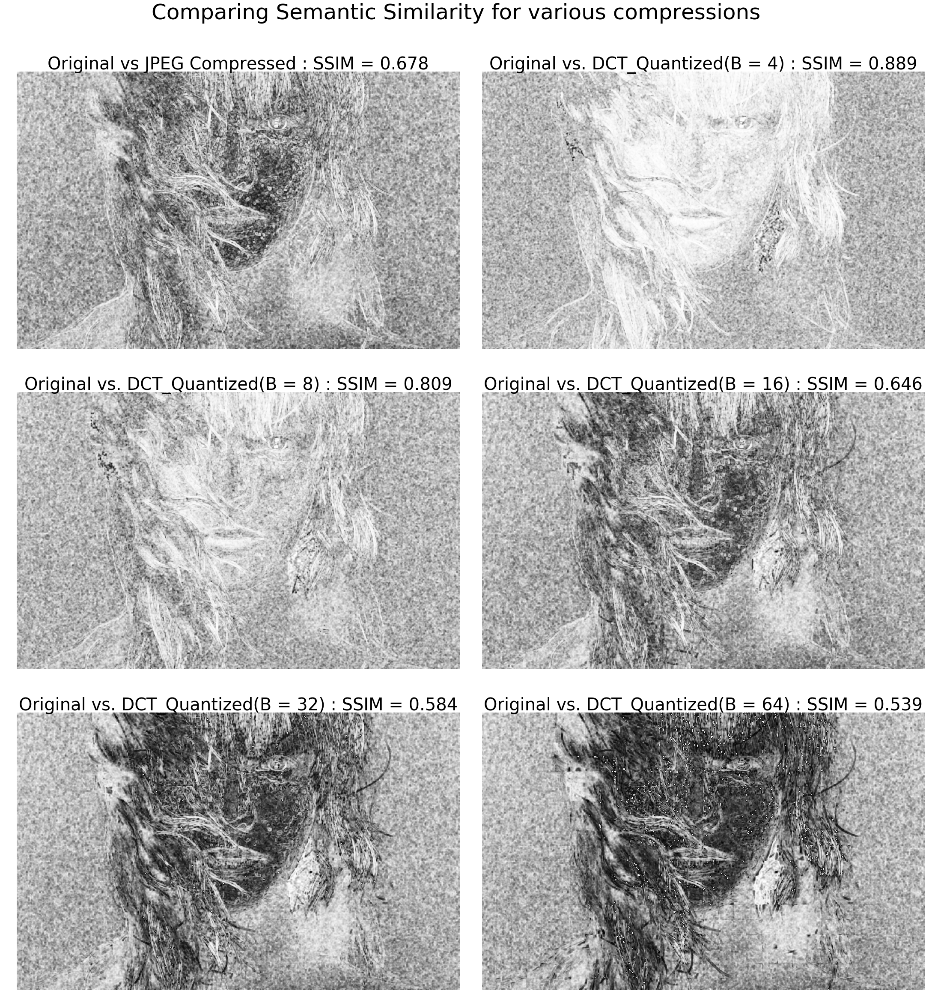

In [263]:
fig, ([ax1, ax2], [ax3, ax4], [ax5, ax6]) = plt.subplots(3,2)
fig.subplots_adjust(hspace=-0.05, wspace=0.05)

fig.suptitle('Comparing Semantic Similarity for various compressions', fontsize=50, y=0.91)
ax1.set_title('Original vs JPEG Compressed : SSIM = ' + str(round(score1,3)), fontsize=40)
im1 = ax1.imshow(diff1,cmap='gray')
ax2.set_title('Original vs. DCT_Quantized(B = 4) : SSIM = ' + str(round(score2,3)), fontsize=40)
im2 = ax2.imshow(diff2,cmap='gray')
ax3.set_title('Original vs. DCT_Quantized(B = 8) : SSIM = ' + str(round(score3,3)), fontsize=40)
im3 = ax3.imshow(diff3,cmap='gray')
ax4.set_title('Original vs. DCT_Quantized(B = 16) : SSIM = ' + str(round(score4,3)), fontsize=40)
im4 = ax4.imshow(diff4,cmap='gray')
ax5.set_title('Original vs. DCT_Quantized(B = 32) : SSIM = ' + str(round(score5,3)), fontsize=40)
im5 = ax5.imshow(diff5,cmap='gray')
ax6.set_title('Original vs. DCT_Quantized(B = 64) : SSIM = ' + str(round(score6,3)), fontsize=40)
im6 = ax6.imshow(diff6,cmap='gray')
ax1.axis('off')
ax2.axis('off')
ax3.axis('off')
ax4.axis('off')
ax5.axis('off')
ax6.axis('off')
plt.show()